# show reconstruct image

In [1]:
import pickle
import yaml
import os
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import torch.nn.functional as F

In [2]:
########################################################################
# load config
########################################################################
with open("./config.yaml", 'rb') as f:
    config = yaml.load(f)

/home/hiroki/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  """


In [3]:
########################################################################
# Setting I/O path
########################################################################
# input dirs
INPUT_ROOT = config['IO_OPTION']['INPUT_ROOT']
dev_path = INPUT_ROOT + "/dev_data"
add_dev_path = INPUT_ROOT + "/add_dev_data"
eval_path = INPUT_ROOT + "/eval_test"
MODEL_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/models'
# machine type
MACHINE_TYPE = config['IO_OPTION']['MACHINE_TYPE']
machine_types = os.listdir(dev_path)
# output dirs
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
RESULT_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/result'
RECONS_OUTDIR = OUTPUT_ROOT +'/eval_reconstruct_img'
PKL_DIR = OUTPUT_ROOT +'/pkl'
os.makedirs(MODEL_DIR, exist_ok=True)

In [4]:
with open('{}/{}_history.pkl'.format(PKL_DIR, 'valve'), 'rb') as file:
    history = pickle.load(file)

In [5]:
history['reconstruct_img']['input'][0].shape

torch.Size([5, 128, 128])

In [6]:
epoch_num = 6 # * 10

In [7]:
input_img = history['reconstruct_img']['input'][epoch_num][0,:,:].to('cpu')
output_img = history['reconstruct_img']['output'][epoch_num][0,:,:].to('cpu')

IndexError: list index out of range

In [ ]:
input_img.shape

In [ ]:
np.array(F.mse_loss(output_img, input_img))

In [ ]:
sns.heatmap(input_img)
plt.title('input')
plt.show()
sns.heatmap(output_img)
plt.title('output')
plt.show()

# eval

## import library

In [8]:
########################################################################
# import default python-library
########################################################################
import os
import glob
import csv
import re
import itertools
import sys
from collections import defaultdict
########################################################################


########################################################################
# import additional python-library
########################################################################
import numpy
from sklearn import metrics
import common as com
import pytorch_modeler as modeler
from pytorch_model import LSTM_AutoEncoder as Model
import torch.utils.data
import yaml
yaml.warnings({'YAMLLoadWarning': False})
import matplotlib.pyplot as plt
import seaborn as sns
########################################################################
import eval_functions as eval_func

## Setting

In [9]:
########################################################################
# load config
########################################################################
with open("./config.yaml", 'rb') as f:
    config = yaml.load(f)

/home/hiroki/anaconda3/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [10]:
########################################################################
# Setting seed
########################################################################
modeler.set_seed(42)

In [11]:
########################################################################
# Setting I/O path
########################################################################
# input dirs
INPUT_ROOT = config['IO_OPTION']['INPUT_ROOT']
dev_path = INPUT_ROOT + "/dev_data"
add_dev_path = INPUT_ROOT + "/add_dev_data"
eval_path = INPUT_ROOT + "/eval_test"
MODEL_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/models'
# machine type
MACHINE_TYPE = config['IO_OPTION']['MACHINE_TYPE']
machine_types = os.listdir(dev_path)
# output dirs
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
RESULT_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/result'
RECONS_OUTDIR = OUTPUT_ROOT +'/eval_reconstruct_img'
os.makedirs(MODEL_DIR, exist_ok=True)

In [12]:
########################################################################
# for original function
########################################################################
param = {}
param["dev_directory"] = dev_path
param["eval_directory"] = eval_path
param["model_directory"] = MODEL_DIR
param["result_directory"] = RESULT_DIR
param["result_file"] = 'result.csv'

In [13]:
from sklearn.metrics import mean_squared_error as mse

def calc_time_anomaly(x, y, label, file_name):
    fig = plt.figure(figsize=(10,5)) # width, height
    fig.suptitle('label={}'.format(int(label)))
    time_anomaly = np.zeros((x.shape[0]))
    for frame in range(x.shape[0]):
        time_anomaly[frame] = mse(y[frame,:],x[frame,:])
    plt.plot(time_anomaly)
    plt.title(f'label:{label}')

In [14]:
time_anomaly.mean()

NameError: name 'time_anomaly' is not defined

In [ ]:
plt.plot(time_anomaly)

In [ ]:
plt.figure(figsize=(5,5))
plt.imshow(np.abs(x-y), aspect='auto')

## run eval

In [17]:
def make_reconstruct_img(x, y, label, file_name):
    fig = plt.figure(figsize=(10,5)) # width, height
    fig.suptitle('label={}'.format(int(label)))
    ax1 = fig.add_subplot(121, title='x') # 明示的にAxesを作成する
    sns.heatmap(x.T, ax=ax1) # ax1を参照するようにする
    ax2 = fig.add_subplot(122, title='y')
    sns.heatmap(y.T, ax=ax2)
    fig.savefig('{}.png'.format(file_name))

In [18]:
mode = 'dev'

/home/hiroki/anaconda3/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
2020-11-09 23:25:40,782 - INFO - load_directory <- development
2020-11-09 23:25:40,784 - INFO - ===========================
2020-11-09 23:25:40,785 - INFO - [1/6] /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/ToyCar
2020-11-09 23:25:40,785 - INFO - ============== MODEL LOAD ==============
2020-11-09 23:25:41,809 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/ToyCar_id_01
2020-11-09 23:25:41,817 - INFO - test_file  num : 601
2020-11-09 23:25:41,818 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:25:54,503 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_ToyCar_id_01.csv
2020-11-09 23:25:54,508 - INFO - AUC : 0.7272623790552077
2020-11-09 23:25:54,509 - INFO - pAUC : 0.5832010304646077
2020-11-09 23:25:54,511 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:25:54,511 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/ToyCar_id_02
2020-11-09 23:25:54,524 - INFO - test_file  num : 602
2020-11-09 23:25:54,525 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:26:08,177 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_ToyCar_id_02.csv
2020-11-09 23:26:08,181 - INFO - AUC : 0.830124716553288
2020-11-09 23:26:08,183 - INFO - pAUC : 0.6782432271154076
2020-11-09 23:26:08,183 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:26:08,185 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/ToyCar_id_03
2020-11-09 23:26:08,200 - INFO - test_file  num : 602
2020-11-09 23:26:08,201 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:26:21,568 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_ToyCar_id_03.csv
2020-11-09 23:26:21,572 - INFO - AUC : 0.6014512471655329
2020-11-09 23:26:21,573 - INFO - pAUC : 0.5467836257309941
2020-11-09 23:26:21,575 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:26:21,578 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/ToyCar_id_04
2020-11-09 23:26:21,590 - INFO - test_file  num : 602
2020-11-09 23:26:21,591 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:26:35,219 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_ToyCar_id_04.csv
2020-11-09 23:26:35,222 - INFO - AUC : 0.8601473922902495
2020-11-09 23:26:35,223 - INFO - pAUC : 0.667561761546724
2020-11-09 23:26:35,224 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:26:35,225 - INFO - ===========================
2020-11-09 23:26:35,226 - INFO - [2/6] /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/ToyConveyor
2020-11-09 23:26:35,232 - INFO - ============== MODEL LOAD ==============
2020-11-09 23:26:35,601 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/ToyConveyor_id_01
2020-11-09 23:26:35,618 - INFO - test_file  num : 1181
2020-11-09 23:26:35,619 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:26:59,128 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_ToyConveyor_id_01.csv
2020-11-09 23:26:59,133 - INFO - AUC : 0.6235564304461942
2020-11-09 23:26:59,135 - INFO - pAUC : 0.534068932172952
2020-11-09 23:26:59,135 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:26:59,138 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/ToyConveyor_id_02
2020-11-09 23:26:59,150 - INFO - test_file  num : 1136
2020-11-09 23:26:59,151 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============
/home/hiroki/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.m

2020-11-09 23:27:22,043 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_ToyConveyor_id_02.csv
2020-11-09 23:27:22,049 - INFO - AUC : 0.5842447916666667
2020-11-09 23:27:22,050 - INFO - pAUC : 0.5113956766917294
2020-11-09 23:27:22,052 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:27:22,053 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/ToyConveyor_id_03
2020-11-09 23:27:22,070 - INFO - test_file  num : 1135
2020-11-09 23:27:22,071 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:27:45,019 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_ToyConveyor_id_03.csv
2020-11-09 23:27:45,023 - INFO - AUC : 0.5797276357351451
2020-11-09 23:27:45,024 - INFO - pAUC : 0.5078120833999893
2020-11-09 23:27:45,025 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:27:45,025 - INFO - ===========================
2020-11-09 23:27:45,026 - INFO - [3/6] /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/fan
2020-11-09 23:27:45,026 - INFO - ============== MODEL LOAD ==============
2020-11-09 23:27:45,682 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/fan_id_00
2020-11-09 23:27:45,688 - INFO - test_file  num : 489
2020-11-09 23:27:45,689 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:27:59,945 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_fan_id_00.csv
2020-11-09 23:27:59,949 - INFO - AUC : 0.52573264781491
2020-11-09 23:27:59,949 - INFO - pAUC : 0.48964957380598023
2020-11-09 23:27:59,950 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:27:59,951 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/fan_id_02
2020-11-09 23:27:59,960 - INFO - test_file  num : 441
2020-11-09 23:27:59,961 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:28:12,748 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_fan_id_02.csv
2020-11-09 23:28:12,751 - INFO - AUC : 0.6759530791788857
2020-11-09 23:28:12,752 - INFO - pAUC : 0.5405155116530329
2020-11-09 23:28:12,755 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:28:12,757 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/fan_id_04
2020-11-09 23:28:12,768 - INFO - test_file  num : 430
2020-11-09 23:28:12,769 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:28:25,269 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_fan_id_04.csv
2020-11-09 23:28:25,273 - INFO - AUC : 0.5781818181818181
2020-11-09 23:28:25,275 - INFO - pAUC : 0.5318979266347688
2020-11-09 23:28:25,275 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:28:25,276 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/fan_id_06
2020-11-09 23:28:25,285 - INFO - test_file  num : 443
2020-11-09 23:28:25,286 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:28:38,850 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_fan_id_06.csv
2020-11-09 23:28:38,853 - INFO - AUC : 0.763731778425656
2020-11-09 23:28:38,855 - INFO - pAUC : 0.558846094828909
2020-11-09 23:28:38,856 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:28:38,863 - INFO - ===========================
2020-11-09 23:28:38,864 - INFO - [4/6] /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/pump
2020-11-09 23:28:38,865 - INFO - ============== MODEL LOAD ==============
2020-11-09 23:28:39,607 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/pump_id_00
2020-11-09 23:28:39,611 - INFO - test_file  num : 237
2020-11-09 23:28:39,611 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:28:47,316 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_pump_id_00.csv
2020-11-09 23:28:47,320 - INFO - AUC : 0.7321897810218978
2020-11-09 23:28:47,321 - INFO - pAUC : 0.6035343834037649
2020-11-09 23:28:47,323 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:28:47,324 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/pump_id_02
2020-11-09 23:28:47,329 - INFO - test_file  num : 205
2020-11-09 23:28:47,330 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:28:54,664 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_pump_id_02.csv
2020-11-09 23:28:54,668 - INFO - AUC : 0.6493333333333333
2020-11-09 23:28:54,669 - INFO - pAUC : 0.6085213032581454
2020-11-09 23:28:54,670 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:28:54,671 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/pump_id_04
2020-11-09 23:28:54,680 - INFO - test_file  num : 194
2020-11-09 23:28:54,681 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:29:01,434 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_pump_id_04.csv
2020-11-09 23:29:01,441 - INFO - AUC : 0.9
2020-11-09 23:29:01,442 - INFO - pAUC : 0.7088465845464725
2020-11-09 23:29:01,443 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:29:01,444 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/pump_id_06
2020-11-09 23:29:01,450 - INFO - test_file  num : 196
2020-11-09 23:29:01,451 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:29:08,903 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_pump_id_06.csv
2020-11-09 23:29:08,906 - INFO - AUC : 0.7076041666666667
2020-11-09 23:29:08,910 - INFO - pAUC : 0.5268640350877193
2020-11-09 23:29:08,912 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:29:08,914 - INFO - ===========================
2020-11-09 23:29:08,915 - INFO - [5/6] /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/slider
2020-11-09 23:29:08,916 - INFO - ============== MODEL LOAD ==============
2020-11-09 23:29:09,548 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/slider_id_00
2020-11-09 23:29:09,553 - INFO - test_file  num : 445
2020-11-09 23:29:09,554 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:29:22,589 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_slider_id_00.csv
2020-11-09 23:29:22,592 - INFO - AUC : 0.9792753623188406
2020-11-09 23:29:22,593 - INFO - pAUC : 0.90465293668955
2020-11-09 23:29:22,594 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:29:22,594 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/slider_id_02
2020-11-09 23:29:22,600 - INFO - test_file  num : 356
2020-11-09 23:29:22,601 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:29:33,356 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_slider_id_02.csv
2020-11-09 23:29:33,359 - INFO - AUC : 0.7812890625000001
2020-11-09 23:29:33,360 - INFO - pAUC : 0.604235197368421
2020-11-09 23:29:33,361 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:29:33,361 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/slider_id_04
2020-11-09 23:29:33,369 - INFO - test_file  num : 267
2020-11-09 23:29:33,370 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:29:42,179 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_slider_id_04.csv
2020-11-09 23:29:42,183 - INFO - AUC : 0.944311377245509
2020-11-09 23:29:42,184 - INFO - pAUC : 0.7169870784746297
2020-11-09 23:29:42,187 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:29:42,187 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/slider_id_06
2020-11-09 23:29:42,193 - INFO - test_file  num : 178
2020-11-09 23:29:42,195 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:29:48,508 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_slider_id_06.csv
2020-11-09 23:29:48,512 - INFO - AUC : 0.7442307692307693
2020-11-09 23:29:48,513 - INFO - pAUC : 0.5141700404858299
2020-11-09 23:29:48,515 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:29:48,516 - INFO - ===========================
2020-11-09 23:29:48,518 - INFO - [6/6] /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/valve
2020-11-09 23:29:48,518 - INFO - ============== MODEL LOAD ==============
2020-11-09 23:29:48,986 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/valve_id_00
2020-11-09 23:29:48,990 - INFO - test_file  num : 213
2020-11-09 23:29:48,991 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:29:55,617 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_valve_id_00.csv
2020-11-09 23:29:55,621 - INFO - AUC : 0.6046017699115044
2020-11-09 23:29:55,621 - INFO - pAUC : 0.5253842571029343
2020-11-09 23:29:55,622 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:29:55,624 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/valve_id_02
2020-11-09 23:29:55,634 - INFO - test_file  num : 214
2020-11-09 23:29:55,635 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:30:01,592 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_valve_id_02.csv
2020-11-09 23:30:01,596 - INFO - AUC : 0.7303508771929825
2020-11-09 23:30:01,597 - INFO - pAUC : 0.5304709141274239
2020-11-09 23:30:01,598 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:30:01,598 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/valve_id_04
2020-11-09 23:30:01,604 - INFO - test_file  num : 214
2020-11-09 23:30:01,607 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:30:07,614 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_valve_id_04.csv
2020-11-09 23:30:07,618 - INFO - AUC : 0.7336842105263157
2020-11-09 23:30:07,620 - INFO - pAUC : 0.5249307479224377
2020-11-09 23:30:07,621 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:30:07,624 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/valve_id_06
2020-11-09 23:30:07,630 - INFO - test_file  num : 214
2020-11-09 23:30:07,631 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-09 23:30:13,774 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/anomaly_score_valve_id_06.csv
2020-11-09 23:30:13,777 - INFO - AUC : 0.5317543859649123
2020-11-09 23:30:13,778 - INFO - pAUC : 0.48476454293628807
2020-11-09 23:30:13,779 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-09 23:30:13,783 - INFO - AUC and pAUC results -> /media/hiroki/working/research/dcase2020/result/2D/LSTM_CNN_AE/LSTM3_CNN_slide_augumentation/result/result.csv


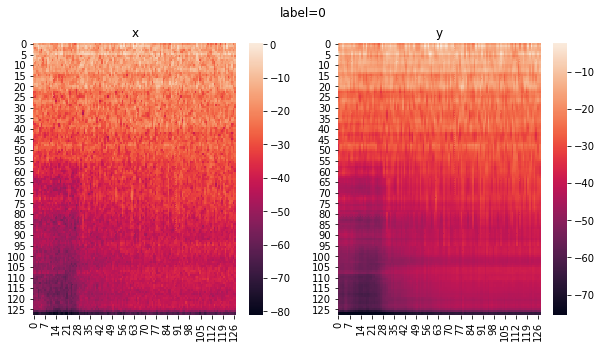

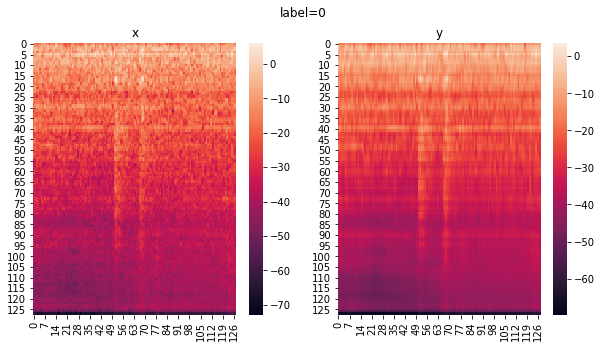

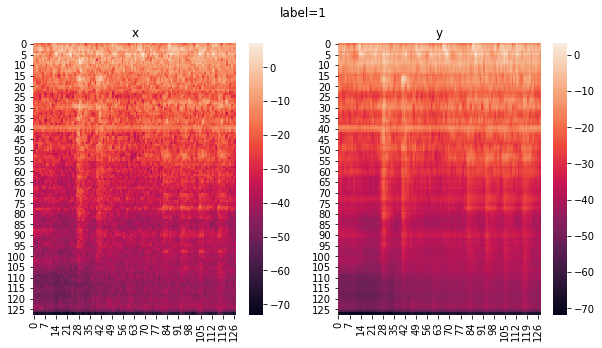

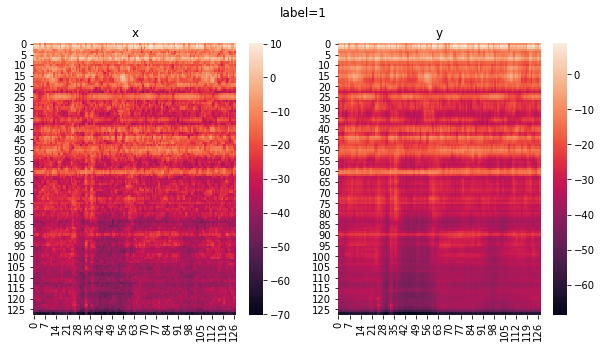

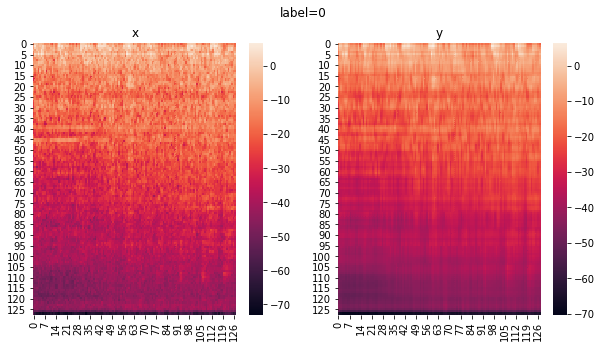

...

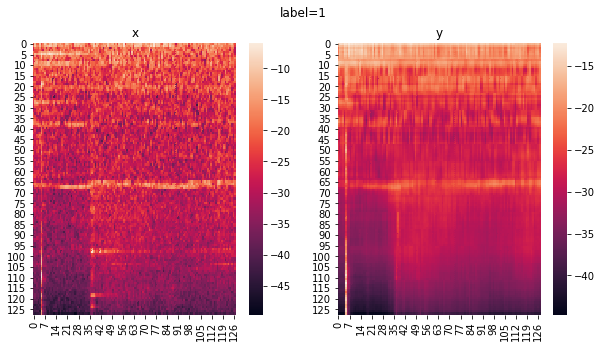

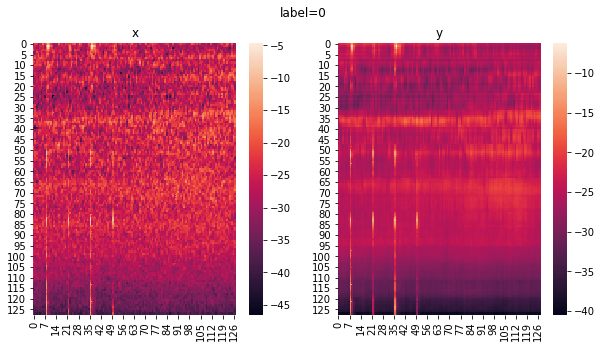

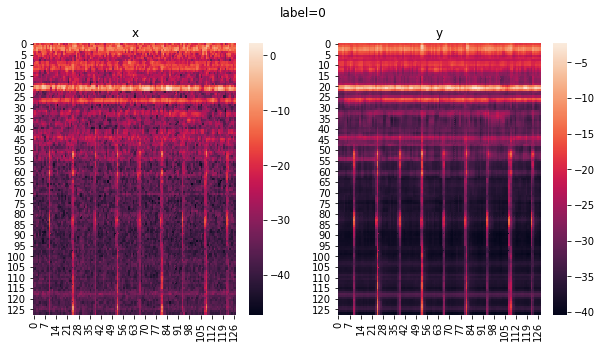

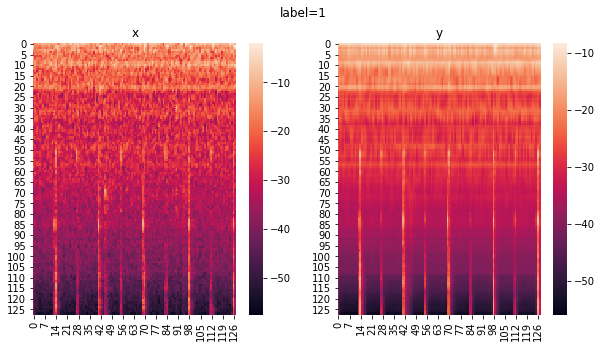

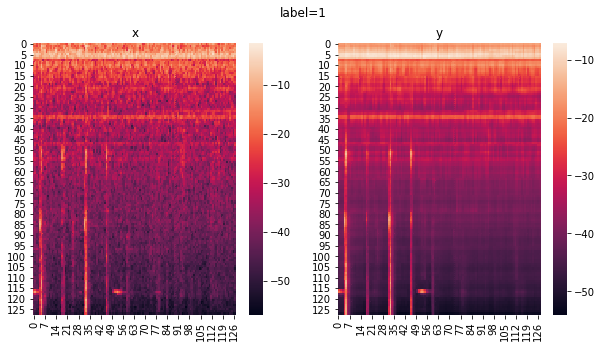

In [19]:
#def run_eval(param, mode):
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# make output result directory
os.makedirs(RESULT_DIR, exist_ok=True)

# load base directory
dirs = com.select_dirs(param=param, mode=mode)

# initialize lines in csv for AUC and pAUC
csv_lines = []


# loop of the base directory
for idx, target_dir in enumerate(dirs):
    com.logger.info("===========================")
    com.logger.info("[{idx}/{total}] {dirname}".format(
        dirname=target_dir, idx=idx+1, total=len(dirs)))

    machine_type = os.path.split(target_dir)[1]

    com.logger.info("============== MODEL LOAD ==============")

    model_file = "{model}/{machine_type}_model.pth".format(
        model=param["model_directory"],
        machine_type=machine_type)

    if not os.path.exists(model_file):
        com.logger.error("{} model not found ".format(machine_type))
        sys.exit(-1)

    # define AE model
    model = Model(sample_rate=config['preprocessing']['sample_rate'],
                  window_size=config['preprocessing']['window_size'],
                  hop_size=config['preprocessing']['hop_size'],
                  mel_bins=config['preprocessing']['mel_bins'],
                  fmin=config['preprocessing']['fmin'],
                  fmax=config['preprocessing']['fmax'],
                  aug_window_size=config['fit']['aug_window_size'],
                  aug_hop_size=config['fit']['aug_hop_size']).to(device)
    model.eval()
    model.load_state_dict(torch.load(model_file))

    if mode:
        # results by type
        csv_lines.append([machine_type])
        csv_lines.append(["id", "AUC", "pAUC"])
        performance = []

    machine_id_list = eval_func.get_machine_id_list_for_test(target_dir)
    recons_outpath = RECONS_OUTDIR + '/' + machine_type
    os.makedirs(recons_outpath, exist_ok=True)
    for id_str in machine_id_list:

        # load list of test files
        test_files, y_true = eval_func.test_file_list_generator(target_dir, id_str, mode)

        # setup anomaly score file path
        anomaly_score_csv = \
            "{result}/anomaly_score_{machine_type}_{id_str}.csv"\
            .format(result=param["result_directory"],
                    machine_type=machine_type,
                    id_str=id_str)
        anomaly_score_list = []

        com.logger.info(
            "============== BEGIN TEST FOR A MACHINE ID ==============")

        y_pred = [0. for k in test_files]
        anomaly_count = 0
        normal_count = 0
        for file_idx, file_path in enumerate(test_files):
            try:
                data = com.file_load(file_path)
                data = data[0]
                # reconstruction through auto encoder in pytorch
                input_data = torch.from_numpy(data).float().to(device)
                input_data = input_data.unsqueeze(0)
                with torch.no_grad():
                    output_dict = model(input_data)
                    pred = output_dict['loss'].to('cpu').detach().numpy().copy()
                    # make reconstruct_img
                    x = output_dict['x'].to('cpu')[0,:,:]
                    y = output_dict['y'].to('cpu')[0,:,:]
                    label = y_true[file_idx]
                    file_name = os.path.basename(file_path).replace('.wav', '')
                    file_name = recons_outpath + '/' + file_name
                    if int(label) == 1:
                        if anomaly_count == 1 or anomaly_count == 2:
                            make_reconstruct_img(x, y, label, file_name)
                        anomaly_count+=1
                    else:
                        if normal_count == 1 or normal_count == 2:
                            make_reconstruct_img(x, y, label, file_name)
                        normal_count+=1
                    
                y_pred[file_idx] = pred
                anomaly_score_list.append(
                    [os.path.basename(file_path), y_pred[file_idx]])
            except FileNotFoundError:
                com.logger.error("file broken!!: {}".format(file_path))

        # save anomaly score
        eval_func.save_csv(save_file_path=anomaly_score_csv,
                           save_data=anomaly_score_list)
        com.logger.info(
            "anomaly score result ->  {}".format(anomaly_score_csv))

        if mode:
            # append AUC and pAUC to lists
            auc = metrics.roc_auc_score(y_true, y_pred)
            p_auc = metrics.roc_auc_score(
                y_true, y_pred, max_fpr=config["etc"]["max_fpr"])
            csv_lines.append([id_str.split("_", 1)[1], auc, p_auc])
            performance.append([auc, p_auc])
            com.logger.info("AUC : {}".format(auc))
            com.logger.info("pAUC : {}".format(p_auc))

        com.logger.info(
            "============ END OF TEST FOR A MACHINE ID ============")

    if mode:
        # calculate averages for AUCs and pAUCs
        averaged_performance = numpy.mean(
            numpy.array(performance, dtype=float), axis=0)
        csv_lines.append(["Average"] + list(averaged_performance))
        csv_lines.append([])

if mode:
    # output results
    result_path = "{result}/{file_name}".format(
        result=param["result_directory"],
        file_name=param["result_file"])
    com.logger.info("AUC and pAUC results -> {}".format(result_path))
    eval_func.save_csv(save_file_path=result_path, save_data=csv_lines)